In [60]:
import geopandas as gpd
import pandas as pd
import pickle
import numpy as np
import random
import collections
import matplotlib.pyplot as plt
from sklearn.neighbors import BallTree
from shapely.geometry import Point
import folium
import json

In [2]:
gdf = gpd.read_file("data2/Brick_Kilns_IGP_PK.geojson")
gdf.head()

,id,lat,lon,type,state,schools1km,hosp1km,pop1km,avg_bricks,dailyprod(,pm2.5d(kg),pm10d(kg),noxd(kg),soxd(kg),seasonprod,pm2.5s(kg),pm10s(kg),noxs(kg),soxs(kg),geometry
0,1,26.133092,68.565789,FCBK,Sindh,0,0,1274,"12,068",36204,246.1872,351.1788,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.56579 26.13309)
1,2,26.131069,68.559271,FCBK,Sindh,0,0,1170,"12,068",36204,246.1872,351.1788,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.55927 26.13107)
2,3,26.139061,68.564912,FCBK,Sindh,0,0,794,"12,068",36204,246.1872,351.1788,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.56491 26.13906)
3,4,26.132216,68.572884,FCBK,Sindh,0,0,752,"12,068",36204,246.1872,351.1788,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.57288 26.13222)
4,5,26.129035,68.576938,FCBK,Sindh,0,0,465,"12,068",36204,246.1872,351.1788,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.57694 26.12904)


In [3]:
gdf.explore()

In [4]:
gdf["type"].value_counts()

type
FCBK    9964
ZZ      1313
Name: count, dtype: int64

In [5]:
gdf["pop1km"].value_counts()

pop1km
2168     15
1865     13
459      12
7580     12
4658     12
         ..
1872      1
1890      1
7620      1
5067      1
11755     1
Name: count, Length: 5605, dtype: int64

In [6]:
# Based on population sizes
conditions = [
    (gdf['pop1km'] < 1500),
    (gdf['pop1km'] >= 1500) & (gdf['pop1km'] < 4000),
    (gdf['pop1km'] >= 4000) & (gdf['pop1km'] < 7000),
    (gdf['pop1km'] >= 7000)
]

choices = [20, 50, 100, 300] # From Economic Life of North Sindh Labor

# Assign base size
gdf['base_laborers'] = np.select(conditions, choices, default=20)

noise = np.random.uniform(0.95, 1.1, size=len(gdf))

gdf['kiln_laborers'] = (gdf['base_laborers'] * noise).astype(int)
gdf.head()

,id,lat,lon,type,state,schools1km,hosp1km,pop1km,avg_bricks,dailyprod(,...,noxd(kg),soxd(kg),seasonprod,pm2.5s(kg),pm10s(kg),noxs(kg),soxs(kg),geometry,base_laborers,kiln_laborers
0,1,26.133092,68.565789,FCBK,Sindh,0,0,1274,"12,068",36204,...,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.56579 26.13309),20,20
1,2,26.131069,68.559271,FCBK,Sindh,0,0,1170,"12,068",36204,...,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.55927 26.13107),20,19
2,3,26.139061,68.564912,FCBK,Sindh,0,0,794,"12,068",36204,...,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.56491 26.13906),20,20
3,4,26.132216,68.572884,FCBK,Sindh,0,0,752,"12,068",36204,...,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.57288 26.13222),20,21
4,5,26.129035,68.576938,FCBK,Sindh,0,0,465,"12,068",36204,...,170.1588,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.57694 26.12904),20,19


In [38]:
zz_punjab = gdf[(gdf['state'] == 'Punjab') & (gdf['type'] == 'ZZ')]
len(zz_punjab)

1299

<Axes: >

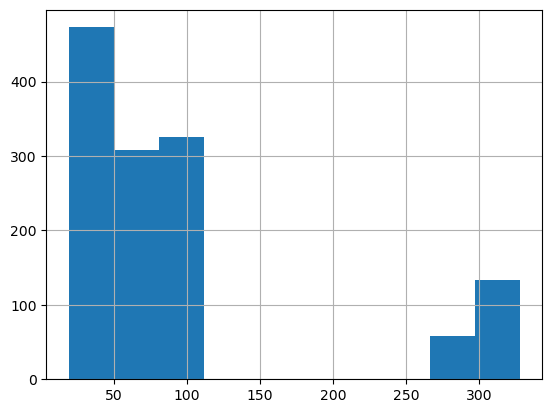

In [52]:
zz_punjab["kiln_laborers"].hist()

In [53]:
zz_punjab

,id,lat,lon,type,state,schools1km,hosp1km,pop1km,avg_bricks,dailyprod(,...,soxd(kg),seasonprod,pm2.5s(kg),pm10s(kg),noxs(kg),soxs(kg),geometry,base_laborers,kiln_laborers,labor_population_jobs
453,454,32.139604,74.834616,ZZ,Punjab,0,0,3988,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (74.83462 32.1396),50,49,"[BrickBaker, Extractor, BrickBaker, BrickMaker..."
455,456,32.136816,74.832086,ZZ,Punjab,0,0,3111,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (74.83209 32.13682),50,49,"[Loader, BrickBaker, CoalLoader, BrickMaker, L..."
460,461,32.142620,74.830321,ZZ,Punjab,0,0,3988,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (74.83032 32.14262),50,53,"[CoalLoader, BrickMaker, BrickMaker, Transport..."
462,463,32.133890,74.837696,ZZ,Punjab,0,0,4562,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (74.8377 32.13389),100,97,"[Extractor, BrickBaker, BrickBaker, Loader, Br..."
463,464,31.731563,73.914819,ZZ,Punjab,0,0,5397,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (73.91482 31.73156),100,109,"[Insulator, Extractor, Insulator, BrickMaker, ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11034,11035,30.366393,72.939359,ZZ,Punjab,0,0,563,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (72.93936 30.36639),20,19,"[Insulator, BrickMaker, BrickMaker, Loader, Lo..."
11092,11093,30.259496,73.053059,ZZ,Punjab,0,0,5765,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (73.05306 30.2595),100,95,"[BrickMaker, BrickBaker, BrickMaker, Extractor..."
11138,11139,30.160305,72.765273,ZZ,Punjab,0,0,1724,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (72.76527 30.1603),50,47,"[CoalLoader, BrickMaker, Extractor, Loader, Dr..."
11189,11190,30.403618,73.040379,ZZ,Punjab,0,0,4416,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (73.04038 30.40362),100,99,"[BrickMaker, BrickMaker, Loader, BrickBaker, B..."


In [41]:
punjab = gdf[gdf['state'] == 'Punjab']

In [48]:
m = folium.Map(location=[zz_punjab.lat.mean(), zz_punjab.lon.mean()], zoom_start=7)

# 3. Add kilns to the map
for _, row in zz_punjab.iterrows():
    # Scale radius based on daily production
    # Adjust the divisor (e.g., 5000) to change the visual scale of the circles
    radius = row['kiln_laborers'] / 500 
    
    folium.CircleMarker(
        location=[row['lat'], row['lon']],
        radius=radius,
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.6,
        popup=f"ID: {row['id']}<br>Prod: {row['kiln_laborers']}<br>State: {row['state']}"
    ).add_to(m)

# Display the map
m

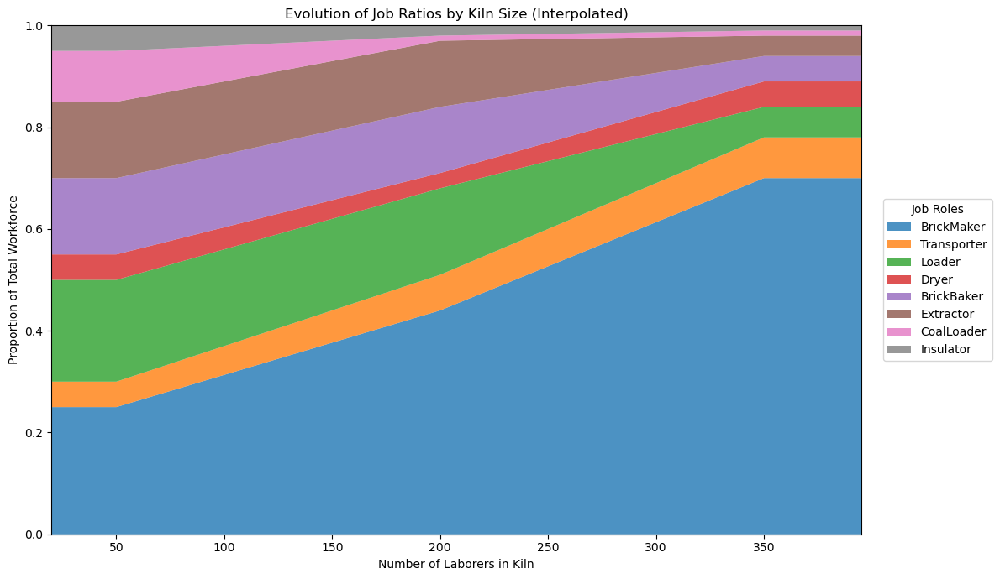

In [7]:
## Visualization of kiln worker distribution

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

# Re-defining the logic for visualization
def get_interpolated_ratios(num_laborers):
    anchor_profiles = {
        50: {
            "BrickMaker": 0.250, "Dryer": 0.050, "Transporter": 0.050,
            "Loader": 0.200, "Extractor": 0.150, "BrickBaker": 0.150,
            "CoalLoader": 0.100, "Insulator": 0.050
        },
        200: {
            "BrickMaker": 0.440, "Dryer": 0.030, "Transporter": 0.070,
            "Loader": 0.170, "Extractor": 0.130, "BrickBaker": 0.130,
            "CoalLoader": 0.010, "Insulator": 0.020
        },
        350: {
            "BrickMaker": 0.700, "Dryer": 0.050, "Transporter": 0.080,
            "Loader": 0.060, "Extractor": 0.040, "BrickBaker": 0.050,
            "CoalLoader": 0.010, "Insulator": 0.010
        }
    }

    sorted_sizes = sorted(anchor_profiles.keys())
    
    # Edge handling
    if num_laborers <= sorted_sizes[0]:
        return anchor_profiles[sorted_sizes[0]].copy()
    if num_laborers >= sorted_sizes[-1]:
        return anchor_profiles[sorted_sizes[-1]].copy()

    lower_bound = sorted_sizes[0]
    upper_bound = sorted_sizes[-1]

    for size in sorted_sizes:
        if size <= num_laborers:
            lower_bound = size
        else:
            upper_bound = size
            break
            
    ratio = (num_laborers - lower_bound) / (upper_bound - lower_bound)

    lower_ratios = anchor_profiles[lower_bound]
    upper_ratios = anchor_profiles[upper_bound]
    
    interpolated_ratios = {}
    for job in lower_ratios:
        p_low = lower_ratios.get(job, 0.0)
        p_high = upper_ratios.get(job, 0.0)
        interpolated_ratios[job] = p_low + ((p_high - p_low) * ratio)

    # Normalize to ensure sum is exactly 1.0
    total = sum(interpolated_ratios.values())
    for k in interpolated_ratios:
        interpolated_ratios[k] /= total
        
    return interpolated_ratios

# Generate data for plotting
sizes = range(20, 400, 5)
data = []
for s in sizes:
    ratios = get_interpolated_ratios(s)
    ratios['KilnSize'] = s
    data.append(ratios)

df_plot = pd.DataFrame(data)
df_plot = df_plot.set_index('KilnSize')

# Plotting - Stacked Area Chart
plt.figure(figsize=(12, 7))
# We sort columns by the final value (at max size) so the largest areas are usually at the bottom or predictable
sorted_cols = df_plot.iloc[-1].sort_values(ascending=False).index
plt.stackplot(df_plot.index, [df_plot[col] for col in sorted_cols], labels=sorted_cols, alpha=0.8)

plt.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), title="Job Roles")
plt.title("Evolution of Job Ratios by Kiln Size (Interpolated)")
plt.xlabel("Number of Laborers in Kiln")
plt.ylabel("Proportion of Total Workforce")
plt.margins(0, 0)
plt.tight_layout()


In [8]:
def get_interpolated_ratios(num_laborers):
    """
    Calculates job probabilities by interpolating between defined 'Anchor' profiles.
    This creates a smooth transition in job roles as kiln size increases.
    """
    # 1. Define your Anchor Profiles
    # These are the "ideal" distributions for specific sizes based on your research.
    # Keys = Kiln Size (approximate center of your previous bins)
    # Values = The job ratio dictionary
    anchor_profiles = {
        # Small Kiln Anchor (approx size 50)
        50: {
            "BrickMaker": 0.250, "Dryer": 0.050, "Transporter": 0.050,
            "Loader": 0.200, "Extractor": 0.150, "BrickBaker": 0.150,
            "CoalLoader": 0.100, "Insulator": 0.050
        },
        # Medium Kiln Anchor (approx size 200)
        200: {
            "BrickMaker": 0.440, "Dryer": 0.030, "Transporter": 0.070,
            "Loader": 0.170, "Extractor": 0.130, "BrickBaker": 0.130,
            "CoalLoader": 0.010, "Insulator": 0.020
        },
        # Large Kiln Anchor (approx size 350+)
        350: {
            "BrickMaker": 0.700, "Dryer": 0.050, "Transporter": 0.080,
            "Loader": 0.060, "Extractor": 0.040, "BrickBaker": 0.050,
            "CoalLoader": 0.010, "Insulator": 0.010
        }
    }

    sorted_sizes = sorted(anchor_profiles.keys())

    # 2. Handle Edge Cases (Smaller than smallest anchor, or larger than largest)
    if num_laborers <= sorted_sizes[0]:
        return anchor_profiles[sorted_sizes[0]]
    if num_laborers >= sorted_sizes[-1]:
        return anchor_profiles[sorted_sizes[-1]]

    # 3. Find the two anchors we are between
    lower_bound = sorted_sizes[0]
    upper_bound = sorted_sizes[-1]

    for size in sorted_sizes:
        if size <= num_laborers:
            lower_bound = size
        else:
            upper_bound = size
            break
            
    # 4. Calculate the weight (alpha)
    # If num_laborers is exactly halfway between bounds, ratio is 0.5
    ratio = (num_laborers - lower_bound) / (upper_bound - lower_bound)

    # 5. Interpolate the probabilities
    lower_ratios = anchor_profiles[lower_bound]
    upper_ratios = anchor_profiles[upper_bound]
    
    interpolated_ratios = {}
    
    # We iterate over keys from the lower profile (assuming both have same keys)
    for job in lower_ratios:
        p_low = lower_ratios.get(job, 0.0)
        p_high = upper_ratios.get(job, 0.0)
        
        # The Formula: val = low + (distance * (high - low))
        interpolated_ratios[job] = p_low + ((p_high - p_low) * ratio)

    return interpolated_ratios

def assign_kiln_jobs(num_laborers):
    if num_laborers <= 0:
        return []

    # Get the smooth ratios for this specific labor count
    job_ratios = get_interpolated_ratios(num_laborers)
    
    jobs = list(job_ratios.keys())
    probs = list(job_ratios.values())
    
    # Normalize probabilities (floating point math might result in 0.99999 or 1.00001)
    probs = np.array(probs)
    probs = probs / probs.sum()

    # Generate the list of jobs
    assigned_jobs = np.random.choice(jobs, size=num_laborers, p=probs).tolist()
    
    return assigned_jobs

# Apply to dataframe
gdf['labor_population_jobs'] = gdf['kiln_laborers'].apply(assign_kiln_jobs)
gdf.head()

,id,lat,lon,type,state,schools1km,hosp1km,pop1km,avg_bricks,dailyprod(,...,soxd(kg),seasonprod,pm2.5s(kg),pm10s(kg),noxs(kg),soxs(kg),geometry,base_laborers,kiln_laborers,labor_population_jobs
0,1,26.133092,68.565789,FCBK,Sindh,0,0,1274,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.56579 26.13309),20,20,"[BrickMaker, Loader, CoalLoader, BrickMaker, C..."
1,2,26.131069,68.559271,FCBK,Sindh,0,0,1170,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.55927 26.13107),20,19,"[BrickMaker, Loader, CoalLoader, Extractor, Br..."
2,3,26.139061,68.564912,FCBK,Sindh,0,0,794,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.56491 26.13906),20,20,"[BrickBaker, Extractor, Loader, BrickMaker, Br..."
3,4,26.132216,68.572884,FCBK,Sindh,0,0,752,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.57288 26.13222),20,21,"[BrickMaker, Loader, CoalLoader, Loader, Brick..."
4,5,26.129035,68.576938,FCBK,Sindh,0,0,465,"12,068",36204,...,166.5384,7783860,52930.248,75503.442,36584.142,35805.756,POINT (68.57694 26.12904),20,19,"[CoalLoader, CoalLoader, Loader, Extractor, Br..."


In [9]:
gdf["type"].value_counts()

type
FCBK    9964
ZZ      1313
Name: count, dtype: int64

In [10]:
len(gdf["labor_population_jobs"][8723]), gdf["kiln_laborers"][0], gdf["labor_population_jobs"][8723]

(50,
 np.int64(20),
 ['Extractor',
  'BrickMaker',
  'BrickMaker',
  'Extractor',
  'Extractor',
  'BrickMaker',
  'Extractor',
  'BrickBaker',
  'Loader',
  'Dryer',
  'BrickMaker',
  'BrickMaker',
  'Extractor',
  'Loader',
  'Loader',
  'Loader',
  'BrickMaker',
  'BrickBaker',
  'Extractor',
  'Transporter',
  'Extractor',
  'Extractor',
  'BrickMaker',
  'Transporter',
  'CoalLoader',
  'Extractor',
  'BrickBaker',
  'Insulator',
  'BrickBaker',
  'CoalLoader',
  'BrickBaker',
  'Loader',
  'BrickBaker',
  'Dryer',
  'Loader',
  'BrickMaker',
  'BrickMaker',
  'Extractor',
  'Extractor',
  'BrickMaker',
  'Insulator',
  'Loader',
  'Loader',
  'BrickMaker',
  'BrickMaker',
  'CoalLoader',
  'BrickMaker',
  'Insulator',
  'Loader',
  'CoalLoader'])

<Axes: >

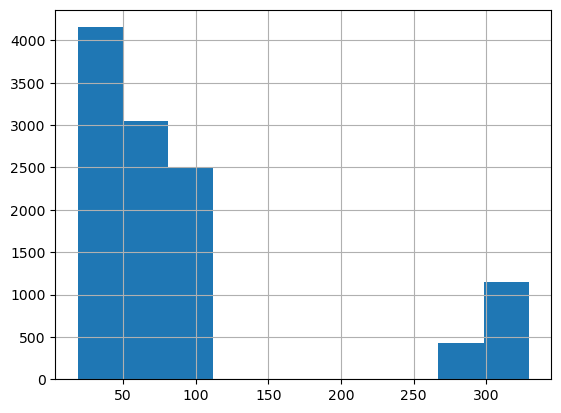

In [11]:
gdf["kiln_laborers"].hist()

In [12]:
min(gdf["kiln_laborers"]), max(gdf["kiln_laborers"])

(19, 329)

In [13]:
import numpy as np
import collections
import random

def distribute_to_families(total_labor, list_of_jobs):
    # Filter jobs
    other_jobs = [j for j in list_of_jobs if j != "BrickMaker"]
    
    # Shuffle specialized jobs so they are assigned randomly to the single workforce
    np.random.shuffle(other_jobs)
    other_job_pool = collections.deque(other_jobs)
    
    families = []
    remaining = total_labor
    
    while remaining > 0:
        # 40% chance of being a family, 60% chance of being a single worker
        is_family = np.random.choice([True, False], p=[0.4, 0.6])
        
        if is_family and remaining >= 2:
            size = min(remaining, np.random.randint(2, 6))
            
            # --- CHANGE 1: Family Logic ---
            # In a family unit (Pathera), the husband is the primary BrickMaker.
            # We rarely assign specialized jobs here; we save them for single men.
            h_age = np.random.randint(19, 50)
            h_job = "BrickMaker" 
            
            w_age = h_age - np.random.randint(1, 5)
            w_job = "BrickMaker" # Wife assists in moulding/stacking
            
            family_members = [
                {'age': h_age, 'gender': 'male', 'job': h_job},
                {'age': max(18, w_age), 'gender': 'female', 'job': w_job}
            ]
            
            # Add children
            for _ in range(size - 2):
                c_age = np.random.randint(8, 19)
                # Children assist the family unit
                family_members.append({
                    'age': c_age, 
                    'gender': random.choice(["male", "female"]), 
                    'job': "BrickMaker"
                })
            
            families.append(family_members)
            remaining -= size
            
        else:
            # --- CHANGE 2: Single Worker Logic ---
            # Single men are the primary candidates for specialized/monthly labor
            # (Drivers, Firemen, etc.) because they are not tied to a moulding pit.
            age = np.random.randint(19, 50)
            
            # If there are specialized jobs left, give them to the single man.
            # Otherwise, he becomes a BrickMaker.
            if other_job_pool:
                job = other_job_pool.popleft()
            else:
                job = "BrickMaker"
                
            families.append([{'age': age, 'gender': 'male', 'job': job}])
            remaining -= 1
            
    return families

In [14]:
gdf["kiln_laborers"].sum()

np.int64(1022633)

In [15]:
expanded_data = []
kiln_size = {}

for idx, row in gdf.iterrows():
    kiln_id = idx
    jobs = row["labor_population_jobs"]
    location =row["geometry"]
    family_list = distribute_to_families(row['kiln_laborers'], jobs)
    for i, family in enumerate(family_list):
        if len(family) == 0: 
            print(row)
        expanded_data.append({
            'kiln_index': kiln_id,
            'family_id': f"{kiln_id}_f{i}",
            'laborer_distribution': family, 
            "location" : row["geometry"], 
            "kiln_type" : row["type"]
        })
        if kiln_id in kiln_size.keys(): 
            kiln_size[kiln_id] += len(family)
        else: 
            kiln_size[kiln_id] = len(family)

In [16]:
max(kiln_size.values()), min(kiln_size.values())

(329, 19)

In [17]:
kiln_size[0]

20

In [18]:
expanded_data[0:5]

[{'kiln_index': 0,
  'family_id': '0_f0',
  'laborer_distribution': [{'age': 47, 'gender': 'male', 'job': 'CoalLoader'}],
  'location': <POINT (68.566 26.133)>,
  'kiln_type': 'FCBK'},
 {'kiln_index': 0,
  'family_id': '0_f1',
  'laborer_distribution': [{'age': 35, 'gender': 'male', 'job': 'BrickMaker'},
   {'age': 33, 'gender': 'female', 'job': 'BrickMaker'},
   {'age': 16, 'gender': 'male', 'job': 'BrickMaker'},
   {'age': 14, 'gender': 'female', 'job': 'BrickMaker'}],
  'location': <POINT (68.566 26.133)>,
  'kiln_type': 'FCBK'},
 {'kiln_index': 0,
  'family_id': '0_f2',
  'laborer_distribution': [{'age': 32, 'gender': 'male', 'job': 'Loader'}],
  'location': <POINT (68.566 26.133)>,
  'kiln_type': 'FCBK'},
 {'kiln_index': 0,
  'family_id': '0_f3',
  'laborer_distribution': [{'age': 25, 'gender': 'male', 'job': 'BrickMaker'},
   {'age': 24, 'gender': 'female', 'job': 'BrickMaker'},
   {'age': 18, 'gender': 'female', 'job': 'BrickMaker'},
   {'age': 16, 'gender': 'male', 'job': 'Bric

In [19]:
len(expanded_data)

517167

In [20]:
family_gdf = pd.DataFrame(expanded_data)
family_gdf.head()

,kiln_index,family_id,laborer_distribution,location,kiln_type
0,0,0_f0,"[{'age': 47, 'gender': 'male', 'job': 'CoalLoa...",POINT (68.565789 26.133092),FCBK
1,0,0_f1,"[{'age': 35, 'gender': 'male', 'job': 'BrickMa...",POINT (68.565789 26.133092),FCBK
2,0,0_f2,"[{'age': 32, 'gender': 'male', 'job': 'Loader'}]",POINT (68.565789 26.133092),FCBK
3,0,0_f3,"[{'age': 25, 'gender': 'male', 'job': 'BrickMa...",POINT (68.565789 26.133092),FCBK
4,0,0_f4,"[{'age': 27, 'gender': 'male', 'job': 'BrickMa...",POINT (68.565789 26.133092),FCBK


In [21]:
len(family_gdf)

517167

In [56]:
punjab_zz_kilns = family_gdf[family_gdf['kiln_index'].isin(zz_punjab['id'])]
print(len(punjab_zz_kilns))
punjab_zz_kilns.head()

63028


,kiln_index,family_id,laborer_distribution,location,kiln_type
9179,454,454_f0,"[{'age': 43, 'gender': 'male', 'job': 'BrickMa...",POINT (74.831867 32.140245),FCBK
9180,454,454_f1,"[{'age': 44, 'gender': 'male', 'job': 'Loader'}]",POINT (74.831867 32.140245),FCBK
9181,454,454_f2,"[{'age': 42, 'gender': 'male', 'job': 'BrickMa...",POINT (74.831867 32.140245),FCBK
9182,454,454_f3,"[{'age': 44, 'gender': 'male', 'job': 'BrickMa...",POINT (74.831867 32.140245),FCBK
9183,454,454_f4,"[{'age': 25, 'gender': 'male', 'job': 'BrickMa...",POINT (74.831867 32.140245),FCBK


In [61]:
# Convert the column to a list
id_list = zz_punjab['id'].tolist()

# Save to a file
with open('zz_punjab.json', 'w') as f:
    json.dump(id_list, f)

In [22]:
def get_family(family, demos):
    assigned_family = []
    for dem in demos: 
        assigned_family.append((family,dem))
    return assigned_family

In [23]:
condensed = {}

for idx, row in family_gdf.iterrows():
    if (row["kiln_index"], row["location"], row["kiln_type"]) in condensed.keys(): 
        condensed[(row["kiln_index"], row["location"], row["kiln_type"])] += get_family(row["family_id"],row["laborer_distribution"])
    else: 
        condensed[(row["kiln_index"], row["location"], row["kiln_type"])] = get_family(row["family_id"],row["laborer_distribution"])


In [24]:
len(gdf), len(condensed)

(11277, 11277)

In [25]:
condensed[next(iter(condensed))]

[('0_f0', {'age': 47, 'gender': 'male', 'job': 'CoalLoader'}),
 ('0_f1', {'age': 35, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f1', {'age': 33, 'gender': 'female', 'job': 'BrickMaker'}),
 ('0_f1', {'age': 16, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f1', {'age': 14, 'gender': 'female', 'job': 'BrickMaker'}),
 ('0_f2', {'age': 32, 'gender': 'male', 'job': 'Loader'}),
 ('0_f3', {'age': 25, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f3', {'age': 24, 'gender': 'female', 'job': 'BrickMaker'}),
 ('0_f3', {'age': 18, 'gender': 'female', 'job': 'BrickMaker'}),
 ('0_f3', {'age': 16, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f4', {'age': 27, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f4', {'age': 25, 'gender': 'female', 'job': 'BrickMaker'}),
 ('0_f4', {'age': 15, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f4', {'age': 18, 'gender': 'female', 'job': 'BrickMaker'}),
 ('0_f5', {'age': 27, 'gender': 'male', 'job': 'BrickMaker'}),
 ('0_f5', {'age': 23, 'gender': 'female', 'job'

In [68]:
with open('zz_punjab.json', 'r') as f:
    kilns_to_tech = json.load(f)
kilns_to_tech[0]

454

In [72]:
list(condensed.keys())[454][0]

454

In [26]:
count = 0
for val in condensed.values(): 
    count += len(val)
count

1022633

In [76]:
def generate_buyers_weighted(synpop_data, buyer_to_kiln_ratio=10, num_kilns_buy_from=100):
    """
    Generates buyers proportional to the local population (kiln size).
    Iterates through every kiln to ensure deterministic, proportional assignment.
    """
    
    # 1. Extract Kiln Data (ID, Location, Size)
    kiln_records = []
    
    for key, workers in synpop_data.items():
        k_id = key[0]
        k_geom = key[1] 
        
        # Handle Geometry (Shapely Point or Tuple)
        if hasattr(k_geom, 'x'):
            lon, lat = k_geom.x, k_geom.y
        else:
            lon, lat = k_geom[0], k_geom[1]
            
        # SIZE: Use number of workers as proxy for local population density
        kiln_size = len(workers) 
        
        kiln_records.append({
            'kiln_id': k_id, 
            'lat': lat, 
            'lon': lon,
            'size': kiln_size
        })
    
    df_kilns = pd.DataFrame(kiln_records)
    
    # 2. Prepare for Spatial Queries (BallTree)
    # Convert lat/lon to radians for Haversine distance
    kiln_coords_rad = np.radians(df_kilns[['lat', 'lon']].values)
    tree = BallTree(kiln_coords_rad, metric='haversine')
    
    # 3. Calculate Buyers Per Kiln Deterministically
    # Total buyers target
    target_total_buyers = len(df_kilns) * buyer_to_kiln_ratio
    total_workers = df_kilns['size'].sum()
    
    # Calculate share of buyers for each kiln
    # We use max(1, ...) to ensure every kiln gets at least one buyer (fulfilling "ensure every kiln gets buyers")
    df_kilns['buyer_count'] = (df_kilns['size'] / total_workers * target_total_buyers).round().astype(int)
    df_kilns['buyer_count'] = df_kilns['buyer_count'].clip(lower=1)
    
    buyers = []
    location_spread = 0.03 # Approx 3km spread
    global_buyer_id = 0
    
    print(f"Generating buyers clustered around {len(df_kilns)} kilns...")

    # 4. Generate Buyers for Each Kiln
    for idx, row in df_kilns.iterrows():
        count = row['buyer_count']
        origin_lat = row['lat']
        origin_lon = row['lon']
        
        # Generate 'count' buyers around this specific kiln
        for _ in range(int(count)):
            # Generate random location near the home kiln
            b_lat = np.random.normal(origin_lat, location_spread)
            b_lon = np.random.normal(origin_lon, location_spread)
            
            # Find the 50 Closest Kilns to this SPECIFIC buyer location
            buyer_loc_rad = np.radians([[b_lat, b_lon]])
            distances, indices = tree.query(buyer_loc_rad, k=num_kilns_buy_from) # Changed k=15 to k=5 (standard optimization, adjust as needed)
            
            closest_ids = df_kilns.iloc[indices[0]]['kiln_id'].tolist()
            
            buyers.append({
                "id": f"b{global_buyer_id}",
                "location": Point(b_lon, b_lat),
                "closest_kilns": closest_ids,
                "origin_kiln": row['kiln_id']
            })
            
            global_buyer_id += 1
            
    return buyers

In [ ]:
buyers_list = generate_buyers_weighted(condensed, buyer_to_kiln_ratio=15, num_kilns_buy_from=1000)
print(f"Generated {len(buyers_list)} buyers.")
"Example Buyer:", buyers_list[0]

In [34]:
with open("synpop.pkl", "wb") as file:
    pickle.dump(condensed, file)

In [81]:
with open("buyers.pkl", "wb") as f:
    pickle.dump(buyers_list, f)